# Error-Structure Analysis

This notebook asks whether neural-to-embedding prediction errors are structured by interpretable stimulus properties: category, embedding typicality, object size/location, and simple image statistics.

It avoids the stronger claim that the decoder preserves the full visual manifold. The goal is to characterize where prediction works, where it fails, and whether failures concentrate on atypical, small/eccentric, or visually ambiguous examples.

In [1]:
from __future__ import annotations

import json
import math
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from PIL import Image
from scipy.stats import spearmanr

sys.path.insert(0, '.')

from config_const import (
    CACHE_DIR,
    CHECKPOINT_DIR,
    HVM_BBOXES_PATH,
    HVM_CATEGORIES,
    HVM_N_CAT,
    HVM_N_VAR,
    HVM_STIM_DIR,
    REPO_ROOT,
)
from data_utils.hvm_loader import _category_stratified_split, make_hvm_multihead_loader
from encoders import MultiHeadTransformerV2

plt.rcParams.update({"figure.dpi": 130, "savefig.dpi": 200})

In [2]:
# Configuration

# Optional: point this to an .npz with arrays such as image_id, category,
# pred_global_siglip, pred_object_siglip, pred_clip, gt_global_siglip,
# gt_object_siglip, gt_clip, and optional bbox/image metadata.
PREDICTION_BUNDLE: Path | None = None

# If no bundle is provided, collect predictions from an HVM MultiHeadTransformerV2 checkpoint.
CHECKPOINT: Path | None = None
SPLIT_SEED: int | None = None
CAT_MODE: str | None = None
NO_CATEGORY = True
BATCH_SIZE = 128
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

OUT_DIR = REPO_ROOT / "results" / "error_structure"
SAVE_OUTPUTS = True
N_NEIGHBORS = 5
N_EXAMPLE_PAIRS = 4

if SAVE_OUTPUTS:
    OUT_DIR.mkdir(parents=True, exist_ok=True)

OUT_DIR

PosixPath('/home/yy3658/NeurObjectGen/results/error_structure')

## Load Test-Set Outputs

The notebook supports two input modes:

1. `PREDICTION_BUNDLE`: load precomputed arrays/metadata from an `.npz` file.
2. Default HVM path: load the best cached multihead V2 checkpoint, run it on the HVM test split, and attach test-set image IDs/categories/paths.

In [3]:
HEAD_SPECS = {
    "global_siglip": {"pred_key": "pred_global_siglip", "target_key": "gt_global_siglip", "model_key": "siglip_global", "loader_key": "siglip", "label": "Global SigLIP"},
    "object_siglip": {"pred_key": "pred_object_siglip", "target_key": "gt_object_siglip", "model_key": "siglip_obj", "loader_key": "siglip_obj", "label": "Object SigLIP"},
    "clip": {"pred_key": "pred_clip", "target_key": "gt_clip", "model_key": "clip", "loader_key": "clip_short", "label": "CLIP"},
}


def load_checkpoint_path(path: Path | None) -> Path:
    if path is not None:
        return path
    config_path = CACHE_DIR / "best_hvm_multihead_v2_given_config.json"
    if config_path.exists():
        return Path(json.loads(config_path.read_text())["checkpoint"])
    sweep_dir = CHECKPOINT_DIR / "multihead_v2" / "hvm_v2"
    best_path, best_score = None, -float("inf")
    for pt in sorted(sweep_dir.glob("*/best.pt")):
        ckpt = torch.load(pt, weights_only=False, map_location="cpu")
        score = float(ckpt.get("metrics", {}).get("val_mean_cos", -float("inf")))
        if score > best_score:
            best_path, best_score = pt, score
    if best_path is None:
        raise FileNotFoundError(f"No checkpoint found under {sweep_dir}")
    return best_path


def build_model(ckpt: dict, n_neurons: int) -> MultiHeadTransformerV2:
    args = ckpt.get("args", {})
    model = MultiHeadTransformerV2(
        n_neurons=n_neurons,
        d_model=int(args["d_model"]),
        n_heads=int(args["n_heads"]),
        n_layers=int(args["n_layers"]),
        shared_dim=int(args["shared_dim"]),
        dropout=float(args["dropout"]),
        n_categories=HVM_N_CAT,
    )
    model.load_state_dict(ckpt["model_state"])
    return model.eval()


def stimulus_path_from_id(image_id: int) -> Path | None:
    category = HVM_CATEGORIES[int(image_id) // HVM_N_VAR]
    within_index = int(image_id) % HVM_N_VAR
    path = HVM_STIM_DIR / category / f"{within_index:02d}.png"
    return path if path.exists() else None


@torch.no_grad()
def collect_hvm_predictions() -> dict:
    ckpt_path = load_checkpoint_path(CHECKPOINT)
    ckpt = torch.load(ckpt_path, weights_only=False, map_location="cpu")
    ckpt_args = ckpt.get("args", {})
    split_seed = int(SPLIT_SEED if SPLIT_SEED is not None else ckpt_args.get("seed", 42))
    cat_mode = CAT_MODE or ckpt_args.get("cat_mode", "given")
    area = ckpt_args.get("area") or "all"
    neuron_indices = ckpt.get("neuron_indices")

    _, _, test_loader = make_hvm_multihead_loader(
        batch_size=BATCH_SIZE, seed=split_seed, area=area, neuron_indices=neuron_indices
    )
    sample_neural, _, _ = next(iter(test_loader))
    model = build_model(ckpt, n_neurons=sample_neural.shape[1]).to(DEVICE)

    arrays = {spec["pred_key"]: [] for spec in HEAD_SPECS.values()}
    arrays.update({spec["target_key"]: [] for spec in HEAD_SPECS.values()})
    cats = []

    for neural, tgt, cat in test_loader:
        x = neural.permute(0, 2, 1).to(DEVICE)
        cat_dev = cat.to(DEVICE)
        if NO_CATEGORY:
            shared = model.encode_neural_embedding(x)
            out = {
                "siglip_global": F.normalize(model.siglip_global_head(shared), dim=-1),
                "siglip_obj": F.normalize(model.siglip_obj_head(shared), dim=-1),
                "clip": F.normalize(model.clip_head(shared), dim=-1),
            }
        else:
            out = model(x, cat_dev, cat_mode=cat_mode)
        for spec in HEAD_SPECS.values():
            arrays[spec["pred_key"]].append(out[spec["model_key"]].detach().cpu().numpy())
            arrays[spec["target_key"]].append(tgt[spec["loader_key"]].detach().cpu().numpy())
        cats.append(cat.numpy())

    _, _, test_idx = _category_stratified_split(split_seed)
    data = {k: np.concatenate(v, axis=0) for k, v in arrays.items()}
    data["image_id"] = test_idx.astype(int)
    data["category_id"] = np.concatenate(cats).astype(int)
    data["category"] = np.array([HVM_CATEGORIES[i] for i in data["category_id"]])
    data["image_path"] = np.array([str(stimulus_path_from_id(i) or "") for i in data["image_id"]])
    data["source_checkpoint"] = str(ckpt_path)
    data["split_seed"] = split_seed
    data["cat_mode"] = cat_mode
    return data


def load_prediction_bundle(path: Path) -> dict:
    bundle = np.load(path, allow_pickle=True)
    data = {k: bundle[k] for k in bundle.files}
    if "category" not in data and "category_id" in data:
        data["category"] = np.array([HVM_CATEGORIES[int(i)] for i in data["category_id"]])
    return data


data = load_prediction_bundle(PREDICTION_BUNDLE) if PREDICTION_BUNDLE else collect_hvm_predictions()
len(data["image_id"]), data.get("source_checkpoint", "prediction bundle")

Loading HVM sessions:   0%|          | 0/5 [00:00<?, ?it/s]

Loading HVM sessions: 100%|██████████| 10/10 [00:40<00:00,  4.04s/it]


HVM multihead loaders (all monkeys): train=270, val=90, test=90, neurons=2330, time=25, targets=(siglip=1152, siglip_obj=1152, clip_short=768) [stratified by category]


/home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


(90,
 '/home/yy3658/NeurObjectGen/checkpoints/multihead_v2/hvm_v2/d64_nh4_nl2_sd512_do0.1_lr0.0003_wd0.01_tn0.02_in0.05_nd0.1_bs128_wsg1.0_wso1.0_wc1.0_uw0.1_nw0.1_nt0.07_cmgiven/best.pt')

In [4]:
def normalize_rows(x: np.ndarray, eps: float = 1e-8) -> np.ndarray:
    x = np.asarray(x, dtype=np.float64)
    return x / np.maximum(np.linalg.norm(x, axis=1, keepdims=True), eps)


def cosine_diag(pred: np.ndarray, gt: np.ndarray) -> np.ndarray:
    return np.sum(normalize_rows(pred) * normalize_rows(gt), axis=1)


def similarity_matrix(pred: np.ndarray, gt: np.ndarray) -> np.ndarray:
    return normalize_rows(pred) @ normalize_rows(gt).T


def one_indexed_ranks(sim: np.ndarray) -> np.ndarray:
    order = np.argsort(-sim, axis=1)
    correct = np.arange(sim.shape[0])[:, None]
    return np.argmax(order == correct, axis=1) + 1


def within_category_ranks(sim: np.ndarray, categories: np.ndarray) -> np.ndarray:
    ranks = np.full(sim.shape[0], np.nan)
    for i, cat in enumerate(categories):
        idx = np.flatnonzero(categories == cat)
        order = idx[np.argsort(-sim[i, idx])]
        ranks[i] = np.argmax(order == i) + 1
    return ranks


def per_image_2afc(sim: np.ndarray, mask: np.ndarray) -> np.ndarray:
    out = np.full(sim.shape[0], np.nan)
    diag = np.diag(sim)
    for i in range(sim.shape[0]):
        foils = sim[i, mask[i]]
        if len(foils) == 0:
            continue
        out[i] = np.mean((diag[i] > foils) + 0.5 * (diag[i] == foils))
    return out


categories = np.asarray(data["category"])
same_cat = categories[:, None] == categories[None, :]
eye = np.eye(len(categories), dtype=bool)
all_foils = ~eye
within_foils = same_cat & ~eye
cross_foils = ~same_cat

## Per-Image Prediction Scores

For each target space, compute cosine accuracy, N-way retrieval rank, within-category rank, top-1/top-5 correctness, and per-image 2AFC scores.

In [5]:
score_df = pd.DataFrame({
    "image_id": np.asarray(data["image_id"]).astype(int),
    "category": categories,
})
if "image_path" in data:
    score_df["image_path"] = np.asarray(data["image_path"]).astype(str)

nn_records = []
space_summaries = []

for space, spec in HEAD_SPECS.items():
    pred = np.asarray(data[spec["pred_key"]])
    gt = np.asarray(data[spec["target_key"]])
    sim = similarity_matrix(pred, gt)
    ranks = one_indexed_ranks(sim)
    within_ranks = within_category_ranks(sim, categories)

    score_df[f"cosine_{space}"] = cosine_diag(pred, gt)
    score_df[f"rank_{space}"] = ranks
    score_df[f"within_category_rank_{space}"] = within_ranks
    score_df[f"top1_{space}"] = ranks <= 1
    score_df[f"top5_{space}"] = ranks <= 5
    score_df[f"2afc_all_{space}"] = per_image_2afc(sim, all_foils)
    score_df[f"2afc_within_category_{space}"] = per_image_2afc(sim, within_foils)
    score_df[f"2afc_cross_category_{space}"] = per_image_2afc(sim, cross_foils)

    nn = np.argsort(-sim, axis=1)[:, :N_NEIGHBORS]
    for i in range(sim.shape[0]):
        for pos, j in enumerate(nn[i], start=1):
            nn_records.append({
                "space": space,
                "query_row": i,
                "neighbor_rank": pos,
                "target_row": int(j),
                "query_image_id": int(score_df.loc[i, "image_id"]),
                "target_image_id": int(score_df.loc[j, "image_id"]),
                "query_category": categories[i],
                "target_category": categories[j],
                "same_category": bool(categories[i] == categories[j]),
                "is_correct": bool(i == j),
                "similarity": float(sim[i, j]),
            })

    space_summaries.append({
        "space": space,
        "mean_cosine": float(score_df[f"cosine_{space}"].mean()),
        "top1": float(score_df[f"top1_{space}"].mean()),
        "top5": float(score_df[f"top5_{space}"].mean()),
        "median_rank": float(np.median(ranks)),
        "mean_2afc_within_category": float(np.nanmean(score_df[f"2afc_within_category_{space}"])),
    })

nn_df = pd.DataFrame(nn_records)
pd.DataFrame(space_summaries)

,space,mean_cosine,top1,top5,median_rank,mean_2afc_within_category
0,global_siglip,0.835680,0.077778,0.277778,14.0,0.712500
1,object_siglip,0.818263,0.044444,0.188889,28.5,0.598611
2,clip,0.735466,0.055556,0.133333,26.5,0.512500


## Category Typicality

Typicality is the cosine similarity between each ground-truth embedding and its category centroid. `residual_norm` is the Euclidean distance from that centroid.

In [6]:
for space, spec in HEAD_SPECS.items():
    gt = np.asarray(data[spec["target_key"]], dtype=np.float64)
    centroids = {}
    for cat in np.unique(categories):
        centroids[cat] = gt[categories == cat].mean(axis=0)
    centroid_arr = np.stack([centroids[cat] for cat in categories], axis=0)
    score_df[f"typicality_{space}"] = cosine_diag(gt, centroid_arr)
    score_df[f"residual_norm_{space}"] = np.linalg.norm(gt - centroid_arr, axis=1)

# User-facing aliases requested in the task.
score_df["typicality_global_siglip"] = score_df["typicality_global_siglip"]
score_df["typicality_object_siglip"] = score_df["typicality_object_siglip"]
score_df["typicality_clip"] = score_df["typicality_clip"]

score_df.head()

,image_id,category,image_path,cosine_global_siglip,rank_global_siglip,within_category_rank_global_siglip,top1_global_siglip,top5_global_siglip,2afc_all_global_siglip,2afc_within_category_global_siglip,...,top5_clip,2afc_all_clip,2afc_within_category_clip,2afc_cross_category_clip,typicality_global_siglip,residual_norm_global_siglip,typicality_object_siglip,residual_norm_object_siglip,typicality_clip,residual_norm_clip
0,24,apple,/home/yy3658/NeurObjectGen/stimuli/hvm_nofixat...,0.856774,12,6.0,False,False,0.876404,0.375,...,True,0.955056,0.5,1.000000,0.914013,0.405686,0.955924,0.294796,1.0,0.0
1,35,apple,/home/yy3658/NeurObjectGen/stimuli/hvm_nofixat...,0.840544,12,5.0,False,False,0.876404,0.500,...,False,0.550562,0.5,0.555556,0.920763,0.390188,0.953982,0.300856,1.0,0.0
2,7,apple,/home/yy3658/NeurObjectGen/stimuli/hvm_nofixat...,0.904109,1,1.0,True,True,1.000000,1.000,...,False,0.550562,0.5,0.555556,0.895340,0.445760,0.911042,0.412728,1.0,0.0
3,28,apple,/home/yy3658/NeurObjectGen/stimuli/hvm_nofixat...,0.850429,5,1.0,False,True,0.955056,1.000,...,False,0.348315,0.5,0.333333,0.919817,0.392395,0.949241,0.315165,1.0,0.0
4,9,apple,/home/yy3658/NeurObjectGen/stimuli/hvm_nofixat...,0.831658,16,4.0,False,False,0.831461,0.625,...,False,0.044944,0.5,0.000000,0.814397,0.588734,0.785764,0.635019,1.0,0.0


## Visual And Object Metadata Features

Bounding-box metadata is loaded when available. Image statistics are computed from image paths when present.

In [7]:
def add_bbox_features(df: pd.DataFrame, data: dict) -> pd.DataFrame:
    df = df.copy()
    n = len(df)
    if {"x", "y", "width", "height"}.issubset(data):
        x = np.asarray(data["x"], dtype=float)
        y = np.asarray(data["y"], dtype=float)
        w = np.asarray(data["width"], dtype=float)
        h = np.asarray(data["height"], dtype=float)
        img_w = np.asarray(data.get("image_width", np.ones(n)), dtype=float)
        img_h = np.asarray(data.get("image_height", np.ones(n)), dtype=float)
        cx = (x + w / 2) / img_w
        cy = (y + h / 2) / img_h
        df["bbox_area_fraction"] = np.asarray(data.get("area", w * h), dtype=float) / (img_w * img_h)
        df["bbox_center_x"] = cx
        df["bbox_center_y"] = cy
        df["bbox_eccentricity_from_center"] = np.sqrt((cx - 0.5) ** 2 + (cy - 0.5) ** 2)
        df["bbox_aspect_ratio"] = w / np.maximum(h, 1e-8)
        return df

    if HVM_BBOXES_PATH.exists() and "image_id" in df:
        bboxes = json.loads(HVM_BBOXES_PATH.read_text())
        by_id = {int(b["idx"]): b for b in bboxes}
        cx, cy, half, source = [], [], [], []
        for image_id in df["image_id"].astype(int):
            b = by_id.get(int(image_id), {})
            cx.append(float(b.get("cx", np.nan)))
            cy.append(float(b.get("cy", np.nan)))
            half.append(float(b.get("half", np.nan)))
            source.append(b.get("source", ""))
        cx = np.asarray(cx)
        cy = np.asarray(cy)
        half = np.asarray(half)
        src_size = 276.0
        df["bbox_area_fraction"] = (2 * half) ** 2 / src_size**2
        df["bbox_center_x"] = cx / src_size
        df["bbox_center_y"] = cy / src_size
        df["bbox_eccentricity_from_center"] = np.sqrt((df["bbox_center_x"] - 0.5) ** 2 + (df["bbox_center_y"] - 0.5) ** 2)
        df["bbox_aspect_ratio"] = 1.0
        df["bbox_source"] = source
    return df


def image_stats(path: str) -> dict[str, float]:
    if not path or not Path(path).exists():
        return {"brightness": np.nan, "contrast": np.nan, "colorfulness": np.nan, "image_complexity": np.nan}
    arr = np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0
    gray = 0.299 * arr[..., 0] + 0.587 * arr[..., 1] + 0.114 * arr[..., 2]
    rg = arr[..., 0] - arr[..., 1]
    yb = 0.5 * (arr[..., 0] + arr[..., 1]) - arr[..., 2]
    colorfulness = math.sqrt(float(np.var(rg) + np.var(yb))) + 0.3 * math.sqrt(float(np.mean(rg) ** 2 + np.mean(yb) ** 2))
    gx = np.diff(gray, axis=1, append=gray[:, -1:])
    gy = np.diff(gray, axis=0, append=gray[-1:, :])
    grad = np.sqrt(gx**2 + gy**2)
    return {
        "brightness": float(gray.mean()),
        "contrast": float(gray.std()),
        "colorfulness": float(colorfulness),
        "image_complexity": float(np.mean(grad > 0.08)),
    }


score_df = add_bbox_features(score_df, data)
if "image_path" in score_df:
    stats_df = pd.DataFrame([image_stats(p) for p in score_df["image_path"]])
    score_df = pd.concat([score_df.reset_index(drop=True), stats_df], axis=1)

score_df.filter(regex="bbox|brightness|contrast|colorfulness|complexity").head()

,bbox_area_fraction,bbox_center_x,bbox_center_y,bbox_eccentricity_from_center,bbox_aspect_ratio,bbox_source,brightness,contrast,colorfulness,image_complexity
0,0.100003,0.499674,0.502754,0.002773,1.0,gdino,0.453922,0.180007,0.002872,0.052589
1,0.087282,0.544493,0.600036,0.109484,1.0,gdino,0.417405,0.141772,0.003121,0.070534
2,0.064619,0.473551,0.481449,0.032306,1.0,gdino,0.369414,0.231685,0.003037,0.029747
3,0.082844,0.497246,0.747790,0.247805,1.0,gdino,0.518955,0.141667,0.002609,0.024010
4,0.863553,0.502283,0.496232,0.004406,1.0,gdino,0.361020,0.153263,0.003063,0.104259


## Correlate Error Structure With Prediction Quality

Spearman correlations test whether per-image cosine accuracy varies monotonically with typicality, category residual, object geometry, and simple image statistics.

In [8]:
base_features = [
    "bbox_area_fraction",
    "bbox_eccentricity_from_center",
    "bbox_aspect_ratio",
    "brightness",
    "contrast",
    "colorfulness",
    "image_complexity",
]

corr_rows = []
for space in HEAD_SPECS:
    features = [f"typicality_{space}", f"residual_norm_{space}"] + base_features
    y = score_df[f"cosine_{space}"]
    for feature in features:
        if feature not in score_df:
            continue
        x = score_df[feature]
        valid = np.isfinite(x) & np.isfinite(y)
        if valid.sum() < 3 or x[valid].nunique() < 2:
            rho, p = np.nan, np.nan
        else:
            rho, p = spearmanr(x[valid], y[valid])
        corr_rows.append({"space": space, "feature": feature, "spearman_r": rho, "p_value": p, "n": int(valid.sum())})

corr_df = pd.DataFrame(corr_rows).sort_values(["space", "feature"])
if SAVE_OUTPUTS:
    corr_df.to_csv(OUT_DIR / "error_correlations.csv", index=False)
    score_df.to_csv(OUT_DIR / "per_image_error_structure.csv", index=False)
    nn_df.to_csv(OUT_DIR / "nearest_neighbors.csv", index=False)
corr_df

,space,feature,spearman_r,p_value,n
20,clip,bbox_area_fraction,0.210322,0.046622,90
22,clip,bbox_aspect_ratio,NaN,NaN,90
21,clip,bbox_eccentricity_from_center,-0.129012,0.225559,90
23,clip,brightness,-0.018430,0.863111,90
25,clip,colorfulness,-0.011005,0.918002,90
24,clip,contrast,0.038729,0.717041,90
26,clip,image_complexity,-0.002494,0.981386,90
19,clip,residual_norm_clip,NaN,NaN,90
18,clip,typicality_clip,-0.047008,0.659959,90
2,global_siglip,bbox_area_fraction,-0.172770,0.103440,90


## Category-Level Summary

In [9]:
cat_rows = []
for cat, g in score_df.groupby("category", sort=True):
    row = {"category": cat, "n_test_images": len(g)}
    for space in HEAD_SPECS:
        row[f"mean_cosine_{space}"] = g[f"cosine_{space}"].mean()
        row[f"median_rank_{space}"] = g[f"rank_{space}"].median()
        row[f"within_category_2afc_{space}"] = g[f"2afc_within_category_{space}"].mean()
        row[f"mean_typicality_{space}"] = g[f"typicality_{space}"].mean()
    cat_rows.append(row)

category_summary = pd.DataFrame(cat_rows)
if SAVE_OUTPUTS:
    category_summary.to_csv(OUT_DIR / "category_summary.csv", index=False)
category_summary

,category,n_test_images,mean_cosine_global_siglip,median_rank_global_siglip,within_category_2afc_global_siglip,mean_typicality_global_siglip,mean_cosine_object_siglip,median_rank_object_siglip,within_category_2afc_object_siglip,mean_typicality_object_siglip,mean_cosine_clip,median_rank_clip,within_category_2afc_clip,mean_typicality_clip
0,apple,9,0.860728,5.0,0.791667,0.913642,0.839013,9.0,0.722222,0.929552,0.718242,38.0,0.500000,1.0
1,bear,9,0.844757,5.0,0.680556,0.914414,0.845901,5.0,0.680556,0.928510,0.782650,7.0,0.500000,1.0
2,car,9,0.852825,6.0,0.833333,0.945323,0.813687,30.0,0.597222,0.941421,0.766647,6.0,0.541667,1.0
3,chair,9,0.820805,29.0,0.625000,0.906757,0.784039,56.0,0.513889,0.924696,0.696351,56.0,0.500000,1.0
4,dog,9,0.835927,14.0,0.750000,0.914466,0.840509,14.0,0.625000,0.933437,0.713408,41.0,0.500000,1.0
5,elephant,9,0.843925,10.0,0.763889,0.923631,0.852383,10.0,0.694444,0.939492,0.735199,30.0,0.555556,1.0
6,head,9,0.862958,7.0,0.861111,0.920026,0.812205,26.0,0.597222,0.917134,0.736114,48.0,0.500000,1.0
7,plane,9,0.799520,52.0,0.611111,0.932593,0.792119,48.0,0.500000,0.949174,0.743557,20.0,0.562500,1.0
8,table,9,0.812152,39.0,0.527778,0.895263,0.761811,69.0,0.527778,0.880625,0.712042,48.0,0.500000,1.0
9,turtle,9,0.823203,32.0,0.680556,0.898284,0.840966,14.0,0.527778,0.928678,0.750447,21.0,0.465278,1.0


## Figures

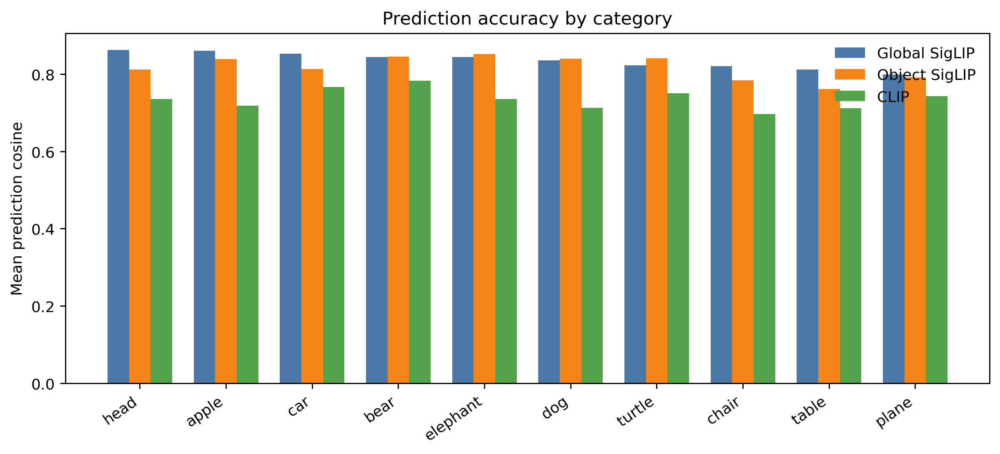

In [10]:
space_colors = {"global_siglip": "#4c78a8", "object_siglip": "#f58518", "clip": "#54a24b"}


def savefig(name: str):
    if SAVE_OUTPUTS:
        plt.savefig(OUT_DIR / name, bbox_inches="tight")


# A. Mean prediction cosine by category.
plot_df = category_summary[["category"] + [f"mean_cosine_{s}" for s in HEAD_SPECS]].melt(
    id_vars="category", var_name="space", value_name="mean_cosine"
)
plot_df["space"] = plot_df["space"].str.replace("mean_cosine_", "", regex=False)
order = category_summary.sort_values("mean_cosine_global_siglip", ascending=False)["category"].tolist()
fig, ax = plt.subplots(figsize=(11, 4.2))
x = np.arange(len(order))
width = 0.25
for offset, space in zip([-width, 0, width], HEAD_SPECS):
    vals = category_summary.set_index("category").loc[order, f"mean_cosine_{space}"]
    ax.bar(x + offset, vals, width, label=HEAD_SPECS[space]["label"], color=space_colors[space])
ax.set_xticks(x)
ax.set_xticklabels(order, rotation=35, ha="right")
ax.set_ylabel("Mean prediction cosine")
ax.set_title("Prediction accuracy by category")
ax.legend(frameon=False)
savefig("prediction_by_category.png")
plt.show()

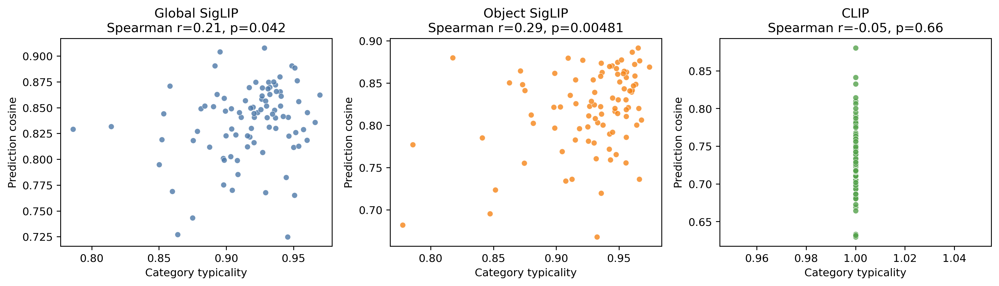

In [11]:
# B. Typicality vs accuracy.
fig, axes = plt.subplots(1, 3, figsize=(13, 3.8), sharey=False)
for ax, space in zip(axes, HEAD_SPECS):
    x = score_df[f"typicality_{space}"]
    y = score_df[f"cosine_{space}"]
    valid = np.isfinite(x) & np.isfinite(y)
    rho, p = spearmanr(x[valid], y[valid]) if valid.sum() >= 3 else (np.nan, np.nan)
    ax.scatter(x, y, s=28, alpha=0.8, color=space_colors[space], edgecolor="white", linewidth=0.4)
    ax.set_xlabel("Category typicality")
    ax.set_ylabel("Prediction cosine")
    ax.set_title(f"{HEAD_SPECS[space]['label']}\nSpearman r={rho:.2f}, p={p:.3g}")
fig.tight_layout()
savefig("typicality_vs_accuracy.png")
plt.show()

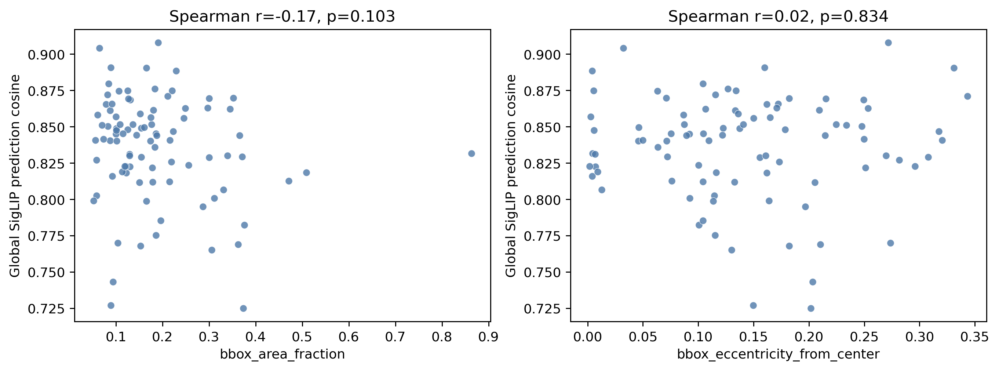

In [12]:
# C. Bbox features vs accuracy, shown for global SigLIP cosine.
bbox_features = ["bbox_area_fraction", "bbox_eccentricity_from_center"]
available_bbox = [f for f in bbox_features if f in score_df]
if available_bbox:
    fig, axes = plt.subplots(1, len(available_bbox), figsize=(5.3 * len(available_bbox), 4), squeeze=False)
    for ax, feature in zip(axes.flat, available_bbox):
        x = score_df[feature]
        y = score_df["cosine_global_siglip"]
        valid = np.isfinite(x) & np.isfinite(y)
        rho, p = spearmanr(x[valid], y[valid]) if valid.sum() >= 3 and x[valid].nunique() > 1 else (np.nan, np.nan)
        ax.scatter(x, y, s=30, alpha=0.8, color="#4c78a8", edgecolor="white", linewidth=0.4)
        ax.set_xlabel(feature)
        ax.set_ylabel("Global SigLIP prediction cosine")
        ax.set_title(f"Spearman r={rho:.2f}, p={p:.3g}")
    fig.tight_layout()
    savefig("bbox_features_vs_accuracy.png")
    plt.show()
else:
    print("No bbox metadata available.")

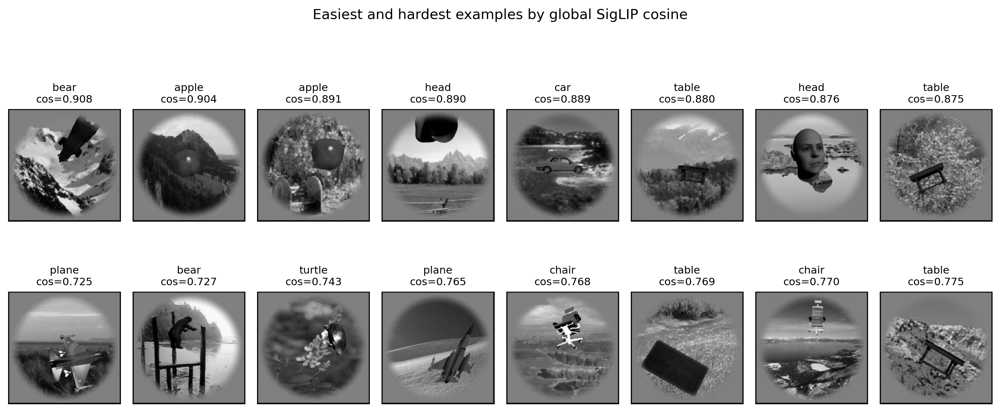

In [13]:
# D. Easiest and hardest examples by global SigLIP cosine.
def show_image_grid(rows: pd.DataFrame, title: str, filename: str | None = None):
    n = len(rows)
    fig, axes = plt.subplots(2, math.ceil(n / 2), figsize=(12, 5.4))
    axes = np.asarray(axes).ravel()
    for ax, (_, row) in zip(axes, rows.iterrows()):
        ax.set_xticks([])
        ax.set_yticks([])
        path = row.get("image_path", "")
        if path and Path(path).exists():
            ax.imshow(Image.open(path).convert("RGB"))
        else:
            ax.text(0.5, 0.5, "image unavailable", ha="center", va="center")
        ax.set_title(f"{row['category']}\ncos={row['cosine_global_siglip']:.3f}", fontsize=9)
    for ax in axes[n:]:
        ax.axis("off")
    fig.suptitle(title, y=1.02)
    fig.tight_layout()
    if filename:
        savefig(filename)
    plt.show()

examples = pd.concat([
    score_df.nlargest(8, "cosine_global_siglip").assign(group="easiest"),
    score_df.nsmallest(8, "cosine_global_siglip").assign(group="hardest"),
])
show_image_grid(examples, "Easiest and hardest examples by global SigLIP cosine", "easiest_hardest_examples.png")

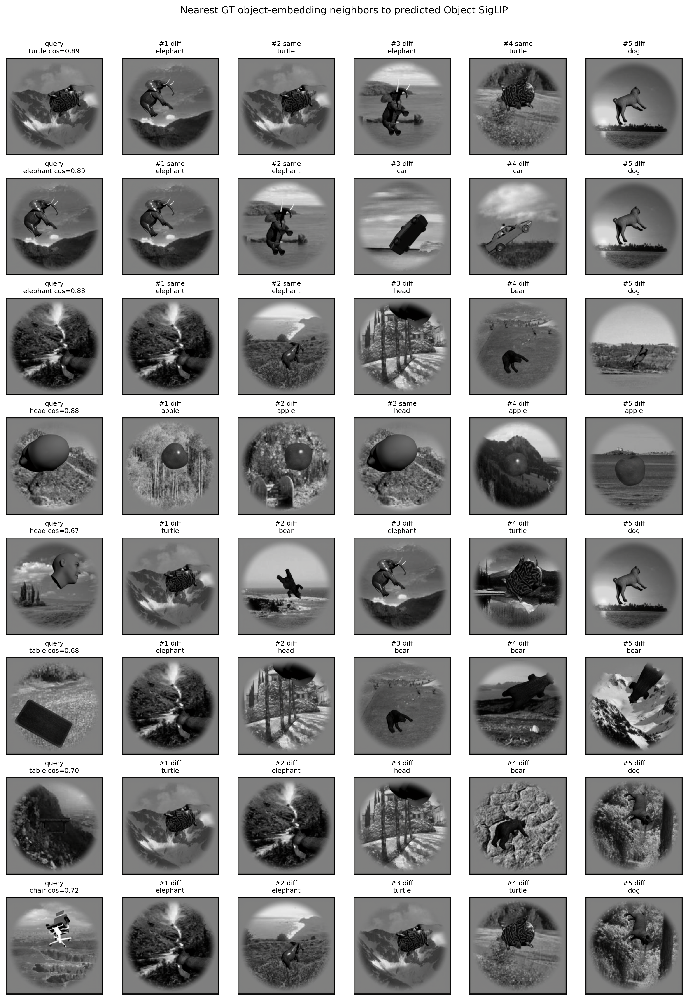

In [14]:
# E. Object SigLIP nearest-neighbor examples for selected easy and hard queries.
def plot_nearest_neighbor_examples(space: str = "object_siglip"):
    selected_rows = pd.concat([
        score_df.nlargest(N_EXAMPLE_PAIRS, f"cosine_{space}"),
        score_df.nsmallest(N_EXAMPLE_PAIRS, f"cosine_{space}"),
    ])
    fig, axes = plt.subplots(len(selected_rows), N_NEIGHBORS + 1, figsize=(2.0 * (N_NEIGHBORS + 1), 2.1 * len(selected_rows)))
    if len(selected_rows) == 1:
        axes = axes[None, :]
    nn_space = nn_df[nn_df["space"] == space]
    for row_i, (query_row, row) in enumerate(selected_rows.iterrows()):
        query_path = row.get("image_path", "")
        axes[row_i, 0].set_title(f"query\n{row['category']} cos={row[f'cosine_{space}']:.2f}", fontsize=8)
        if query_path and Path(query_path).exists():
            axes[row_i, 0].imshow(Image.open(query_path).convert("RGB"))
        axes[row_i, 0].set_xticks([])
        axes[row_i, 0].set_yticks([])
        neigh = nn_space[nn_space["query_row"] == query_row].sort_values("neighbor_rank").head(N_NEIGHBORS)
        for col, (_, nn_row) in enumerate(neigh.iterrows(), start=1):
            target = score_df.iloc[int(nn_row["target_row"])]
            path = target.get("image_path", "")
            if path and Path(path).exists():
                axes[row_i, col].imshow(Image.open(path).convert("RGB"))
            mark = "same" if nn_row["same_category"] else "diff"
            axes[row_i, col].set_title(f"#{int(nn_row['neighbor_rank'])} {mark}\n{target['category']}", fontsize=8)
            axes[row_i, col].set_xticks([])
            axes[row_i, col].set_yticks([])
    fig.suptitle(f"Nearest GT object-embedding neighbors to predicted {HEAD_SPECS[space]['label']}", y=1.01)
    fig.tight_layout()
    savefig("nearest_neighbor_examples.png")
    plt.show()

if "image_path" in score_df:
    plot_nearest_neighbor_examples()
else:
    print("No image paths available for nearest-neighbor figure.")

## Interpretation Checklist

Use the saved tables and figures to evaluate the target claim carefully:

> Neural-to-embedding prediction errors are structured, not random. The model performs best for category-typical or visually canonical stimuli and fails on atypical viewpoints, small/eccentric objects, or visually ambiguous exemplars.

Evidence supporting this claim would include positive correlations between typicality and prediction cosine, negative correlations between residual norm/eccentricity and cosine, category-level differences that are stable across spaces, and hard examples that look atypical or ambiguous on visual inspection. Evidence against it would be weak/null correlations, inconsistent category summaries, or hard examples without interpretable visual structure.